In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import scipy.stats as stats
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.collections import LineCollection

## Importing the csv files of selection coefficients and validating the intercept inferred by the OLS regressions

In [7]:
s_300 = pd.read_csv("Data_compiled_25-12-23/s_all_1n_FCY1_300_final.csv")
s_150_F3F4 = pd.read_csv("Data_compiled_25-12-23/s_all_1n_FCY1_150_F3F4.csv")
s_150_CDS = pd.read_csv("Data_compiled_25-12-23/s_all_1n_FCY1_150_CDS.csv")

In [8]:
s_300.columns

Index(['Library', 'Genotype', 's_T0toT1_Total', 's_T0toT2_Total',
       's_T0toT3_Total', 'intercept_T0toT1_Total', 'intercept_T0toT2_Total',
       'intercept_T0toT3_Total', 'ratio_T0toT1_Total', 'ratio_T0toT2_Total',
       'ratio_T0toT3_Total', 'N_T0', 'freq_T0', 'N_T3', 'freq_T3',
       's_T0toT1_Ref', 's_T0toT2_Ref', 's_T0toT3_Ref', 'intercept_T0toT1_Ref',
       'intercept_T0toT2_Ref', 'intercept_T0toT3_Ref', 'ratio_T0toT1_Ref',
       'ratio_T0toT2_Ref', 'ratio_T0toT3_Ref', 's_T0toT1_Time',
       's_T0toT2_Time', 's_T0toT3_Time', 'intercept_T0toT1_Time',
       'intercept_T0toT2_Time', 'intercept_T0toT3_Time', 'ratio_T0toT1_Time',
       'ratio_T0toT2_Time', 'ratio_T0toT3_Time', 'Alias', 'Bio_rep',
       'Tech_rep', 'With_CDS_spikeins', 'Condition', 'Mutation type',
       'Position'],
      dtype='object')

In [9]:
intercept_cols = ['intercept_T0toT1_Total', 'intercept_T0toT2_Total','intercept_T0toT3_Total',
                  'intercept_T0toT1_Ref','intercept_T0toT2_Ref', 'intercept_T0toT3_Ref',
                 'intercept_T0toT1_Time','intercept_T0toT2_Time', 'intercept_T0toT3_Time']

First for the FCY1-300 library

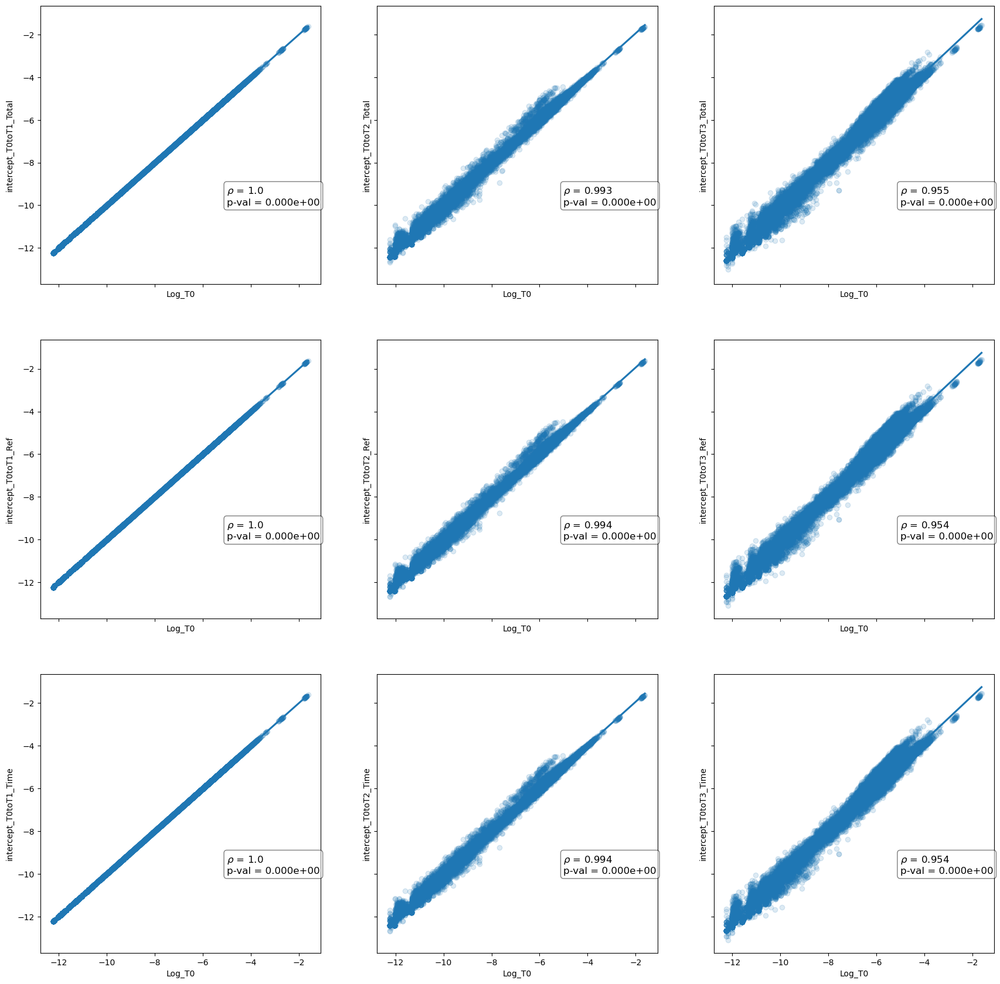

In [68]:
s_300['Log_T0'] = np.log(s_300['freq_T0'])

fig, axs = plt.subplots(3, 3, figsize=(21, 21), sharex=True, sharey=True)
row = 0
col = 0

for int_var in intercept_cols:
    
    sns.regplot(data=s_300, x='Log_T0', y=int_var, ax=axs[row, col], scatter_kws={'alpha':0.15})
    
    int_comp = s_300[['Log_T0', int_var]].copy().dropna().reset_index(drop=True)
    rho_int = stats.spearmanr(int_comp['Log_T0'], int_comp[int_var])
    axs[row, col].annotate(r"$\rho$ = "f'{round(rho_int[0], 3)}\np-val = {rho_int[1]:.3e}',
                           (-5, -10), bbox=dict(boxstyle='round', fc='w', alpha=0.5), fontsize=12)
    if col == 2:
        row += 1
        col=0
        
    else:
        col += 1

#fig.suptitle('Correlation of selection coefficients between libraries, for T0->T3', fontsize=24, y=0.9)
#fig_corr_5FC_F3F4 = plt.gcf()

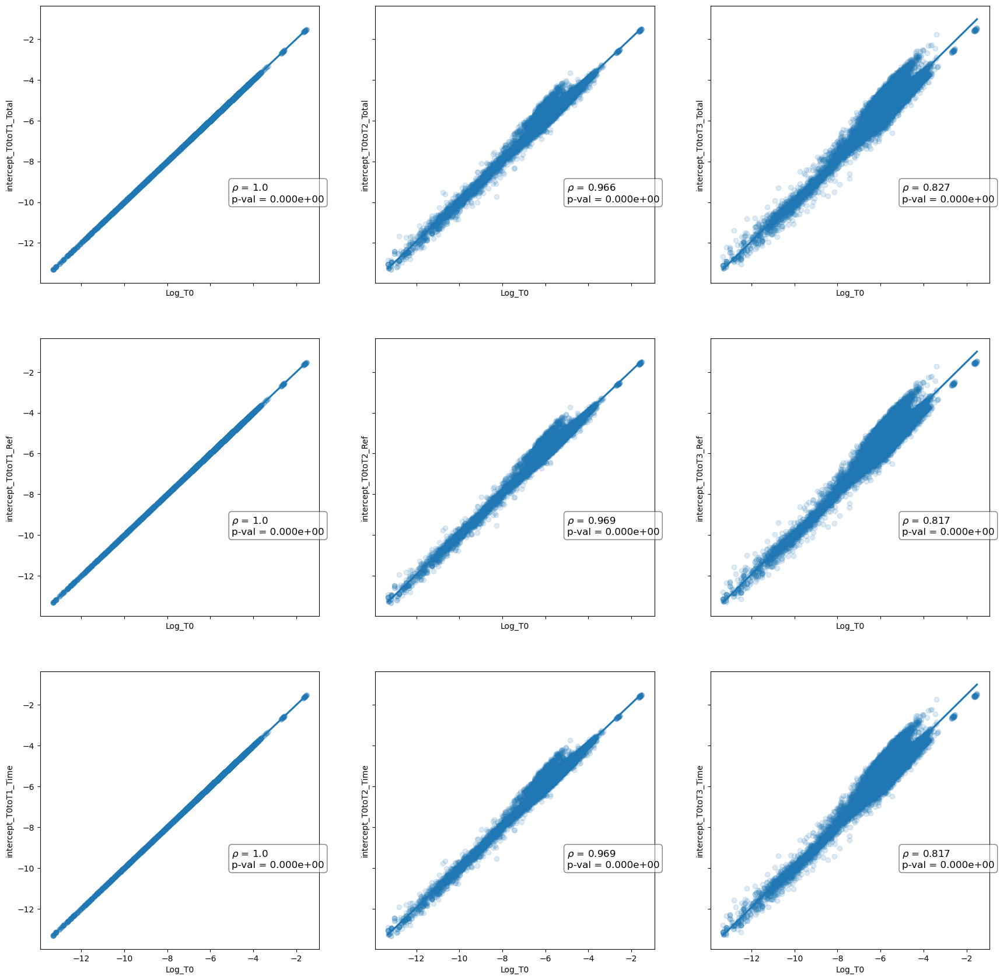

In [69]:
# For the F3F4 150 library
s_150_F3F4['Log_T0'] = np.log(s_150_F3F4['freq_T0'])

fig, axs = plt.subplots(3, 3, figsize=(21, 21), sharex=True, sharey=True)
row = 0
col = 0

for int_var in intercept_cols:
    
    sns.regplot(data=s_150_F3F4, x='Log_T0', y=int_var, ax=axs[row, col], scatter_kws={'alpha':0.15})
    
    int_comp = s_150_F3F4[['Log_T0', int_var]].copy().dropna().reset_index(drop=True)
    rho_int = stats.spearmanr(int_comp['Log_T0'], int_comp[int_var])
    axs[row, col].annotate(r"$\rho$ = "f'{round(rho_int[0], 3)}\np-val = {rho_int[1]:.3e}',
                           (-5, -10), bbox=dict(boxstyle='round', fc='w', alpha=0.5), fontsize=12)
    if col == 2:
        row += 1
        col=0
        
    else:
        col += 1

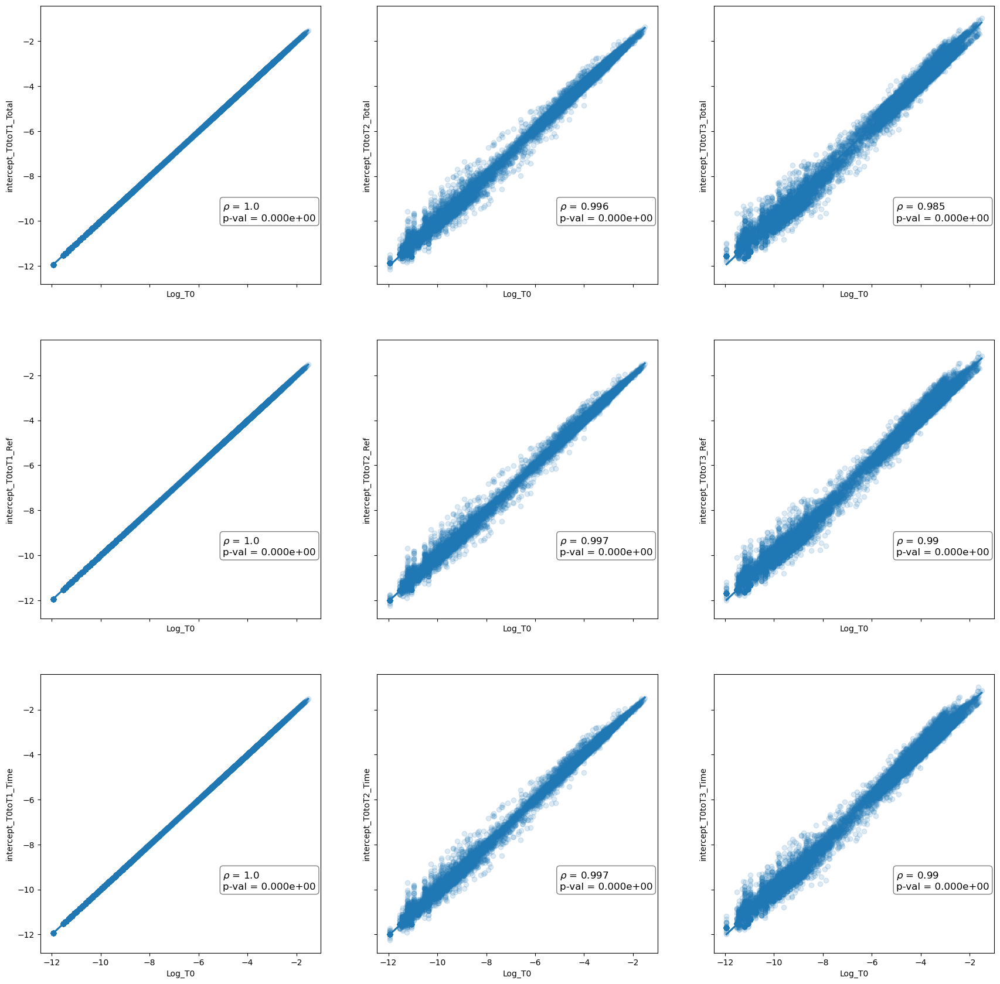

In [70]:
# For the CDS 150 library
s_150_CDS['Log_T0'] = np.log(s_150_CDS['freq_T0'])

fig, axs = plt.subplots(3, 3, figsize=(21, 21), sharex=True, sharey=True)
row = 0
col = 0

for int_var in intercept_cols:
    
    sns.regplot(data=s_150_CDS, x='Log_T0', y=int_var, ax=axs[row, col], scatter_kws={'alpha':0.15})
    
    int_comp = s_150_CDS[['Log_T0', int_var]].copy().dropna().reset_index(drop=True)
    rho_int = stats.spearmanr(int_comp['Log_T0'], int_comp[int_var])
    axs[row, col].annotate(r"$\rho$ = "f'{round(rho_int[0], 3)}\np-val = {rho_int[1]:.3e}',
                           (-5, -10), bbox=dict(boxstyle='round', fc='w', alpha=0.5), fontsize=12)
    if col == 2:
        row += 1
        col=0
        
    else:
        col += 1

The inferred intercept is almost perfectly correlated to the "ground truth" intercept, which is the wt-relative log frequency at T0 for each genotype. This shows that the regression works mostly as intended. 

A larger discrepancy appears at T3, which is likely caused by "hidden" secondary mutations (outside of the sequenced region) taking over their respective genotype label.

## Validating whether the log frequency trajectories are linear from T0 to T3

To ensure that no intermediate timepoint is an outlier which should be removed, let's look at the trajectories of WT-relative frequencies through time. 

In [75]:
def plot_freq_traj(df, freq_col, time_col, time_dict, s_col, s_cutoff, hue_col, log_hue=True):
    
    # Constructing the vectors of time labels
    timepoints_list = list(time_dict.keys())
    timepoints_list.sort()
    
    times_vect = np.array([time_dict[x] for x in timepoints_list])
    
    # Copying the df to avoid modifying the original object
    df_within = df.copy()
    
    # Log scaling the relative frequency
    df_within[freq_col] = np.log(df_within[freq_col])
    
    # Finding the min and max which will be used for the ylimits
    freq_min = np.min(df_within[freq_col])
    freq_max = np.max(df_within[freq_col])
    
    # Log10 scaling of the hue column, if necessary
    if log_hue:
        df_within[hue_col] = np.log10(df_within[hue_col])
        df_within = df_within.rename(columns={f'{hue_col}': f'Log10_{hue_col}'})
        hue_label = f'Log10_{hue_col}'
        
    else:
        hue_label = hue_col

    # Chekcking how many libraries there are (used to set the dimensions and number of axes)
    n_libs = df_within['Library'].unique().shape[0]
    
    # Subsetting the df according to selection coefficients
    pos_s = s_cutoff
    neg_s = - s_cutoff
    
    bene_freqs = df_within[df_within[s_col] > pos_s].copy().reset_index(drop=True)
    dele_freqs = df_within[df_within[s_col] < neg_s].copy().reset_index(drop=True)
    neutral_freqs = df_within[(df_within[s_col] < pos_s) & (df_within[s_col] > neg_s)].copy().reset_index(drop=True)
    
    # defining a dictonnary to access the variant type subsets
    types_dict = {'Beneficial': bene_freqs, 'Neutral': neutral_freqs, 'Deleterious': dele_freqs}
    
    # Creating the figure and plotting the trajectories
    fig, axs = plt.subplots(n_libs, 3, figsize=(18, 6*n_libs), sharex=True, sharey=True)
    col_num = 0
        
    for var_type in ['Deleterious', 'Neutral', 'Beneficial']:
        traj_subset = types_dict[var_type]
        
        row_num = 0  # Going back to the first row when we begin with a nmew type of variant
        
        lib_codes = list(traj_subset['Library'].unique())
        lib_codes.sort()
        
        for lib_id in lib_codes:
            
            lines_data = []
            hue_array = []
            
            lib_subset = traj_subset[traj_subset['Library'] == lib_id].copy().reset_index(drop=True) 
            
            for var_id in lib_subset['Genotype'].unique():
                var_subset = lib_subset[lib_subset['Genotype'] == var_id].copy().reset_index(drop=True)
                
                freq_vect = []
                
                for timepoint in timepoints_list:
                    time_subset = var_subset[var_subset['Timepoint'] == timepoint].copy().reset_index(drop=True)
                    
                    if not time_subset.empty:
                        freq_vect += [time_subset.at[0, freq_col]]
                        
                    elif time_subset.empty:
                        freq_vect += [np.nan]
                        
                lines_data += [np.column_stack([times_vect, np.array(freq_vect)])]
                hue_array += [np.mean(var_subset[hue_label])]  # This assumes that this value is the same across data points
            
            # Preparing the LineCollection to be plotted
            line_segments = LineCollection(np.array(lines_data), array=np.array(hue_array), alpha=0.25, linewidth=0.125)
            
            # Plotting the line collection and setting the figure
            axs[row_num, col_num].add_collection(line_segments)
            fig_obj = axs[row_num, col_num].add_collection(line_segments)
            
            axs[row_num, col_num].set_facecolor('darkgrey')
            axs[row_num, col_num].set_xlim(0, np.max(times_vect)+0.05)
            axs[row_num, col_num].set_ylim(freq_min, freq_max)

            divider = make_axes_locatable(axs[row_num, col_num])
            cax = divider.append_axes('right', size='5%', pad=0.05)
            fig.colorbar(fig_obj, cax=cax, orientation='vertical', label=f"{hue_label}")
            
            axs[row_num, col_num].set_title(f'{var_type} variants in {lib_id}', fontsize=18)
            
            if col_num == 0:
                axs[row_num, col_num].set_ylabel(f'{freq_col}', fontsize=14)

            if row_num == (n_libs - 1):
                axs[row_num, col_num].set_xlabel(f'{time_col}', fontsize=16)
        
            row_num += 1  # Incrementing the row_num before going to the next library
            
        col_num += 1
    
    lines_fig = plt.gcf()
    
    #return lines_fig

The frequencies (wt-relative) are first imported and merged with the selection coefficients - such that deleterious, neutral and beneficial effects can be separated

In [173]:
freqs_300 = pd.read_csv("Data_compiled_25-12-23/freqs_all_1n_FCY1_300_final.csv").rename(columns={'Mutations': 'Genotype'})
freqs_150_F3F4 = pd.read_csv("Data_compiled_25-12-23/freqs_all_1n_FCY1_150_F3F4.csv").rename(columns={'Mutations': 'Genotype'})
freqs_150_CDS = pd.read_csv("Data_compiled_25-12-23/freqs_all_1n_FCY1_150_CDS.csv").rename(columns={'Mutations': 'Genotype'})

# Merging each with the corresponding selection coefficients (only one column chosen)
freqs_300 = pd.merge(freqs_300, s_300[['Library', 'Genotype', 's_T0toT3_Ref', 'N_T0']], how='outer', on=['Library', 'Genotype']).dropna(subset=['N_T0']).reset_index(drop=True)
freqs_150_F3F4 = pd.merge(freqs_150_F3F4, s_150_F3F4[['Library', 'Genotype', 's_T0toT3_Ref', 'N_T0']], how='outer', on=['Library', 'Genotype']).dropna(subset=['N_T0']).reset_index(drop=True)
freqs_150_CDS = pd.merge(freqs_150_CDS, s_150_CDS[['Library', 'Genotype', 's_T0toT3_Ref', 'N_T0']], how='outer', on=['Library', 'Genotype']).dropna(subset=['N_T0']).reset_index(drop=True)

# Reformatting the 'Library' column, to be simply L{lib_number}
freqs_300['Library'] = freqs_300['Library'].apply(lambda x: x.split('_')[1])
freqs_150_F3F4['Library'] = freqs_150_F3F4['Library'].apply(lambda x: x.split('_')[1])
freqs_150_CDS['Library'] = freqs_150_CDS['Library'].apply(lambda x: x.split('_')[1])

Importing time (in hours dans generations) data, which will be needed to make those plots

In [175]:
gen_time_df = pd.read_csv("Gen_time_df.csv")

Then, plotting the trajectories. Only genotypes which were observed at the T0 are considered. First, for the 300 paired-end F3F4 sequencing:

In [177]:
# Separating the samples into three groups with different screen duration
libs_No5FC = ['L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'L7', 'L8', 'L9', 'L10', 'L11']
libs_with5FC = ['L12', 'L13', 'L14', 'L15', 'L16', 'L17', 'L18', 'L19']
libs_spiked = ['L20', 'L21', 'L22', 'L23', 'L24', 'L25', 'L26', 'L27']

F3F4_300_No = freqs_300[freqs_300['Library'].isin(libs_No5FC)].copy().reset_index(drop=True)
F3F4_300_5FC = freqs_300[freqs_300['Library'].isin(libs_with5FC)].copy().reset_index(drop=True)
F3F4_300_spiked = freqs_300[freqs_300['Library'].isin(libs_spiked)].copy().reset_index(drop=True)

In [178]:
F3F4_300_spiked[F3F4_300_spiked['Library'] == 'L23']['Timepoint'].unique()

array(['T0', 'T1', 'T3'], dtype=object)

In [179]:
time_dicts = []
# Adding the corresponding time data
for F3F4_df in [F3F4_300_No, F3F4_300_5FC, F3F4_300_spiked]:
    libs_tokeep = F3F4_df['Library'].unique()
    
    time_subset = gen_time_df[gen_time_df['Library'].isin(libs_tokeep)].copy().reset_index(drop=True)
    time_dict = {'T0': 0, 'T1': np.mean(time_subset['T1_gen_ref']),
                'T2': np.mean(time_subset['T2_gen_ref']),
                'T3': np.mean(time_subset['T3_gen_ref'])}
    time_dicts += [time_dict]
                              
    F3F4_df['Ref_generations'] = F3F4_df['Timepoint'].apply(lambda x: time_dict[x])

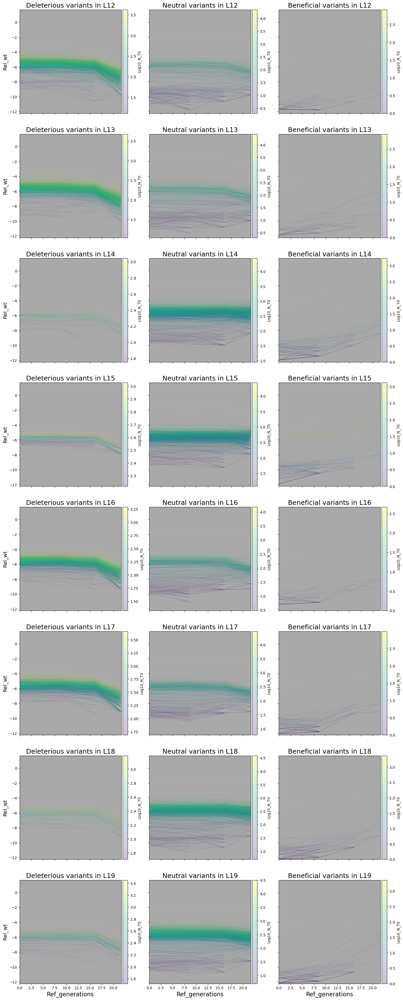

In [180]:
# First for the samples with 5-FC (no spike-ins)
plot_freq_traj(F3F4_300_5FC, 'Rel_wt', 'Ref_generations', time_dicts[1], 's_T0toT3_Ref', 0.05, 'N_T0')

lines_300 = plt.gcf()
lines_300.savefig('lines_300.png', bbox_inches='tight')

This justifies using the T0->T2 selection coefficients, since most of the deleterious calls are clearly based on a change of slope which occurred between T2 and T3.

Do we get something similar for the 300 paired-end samples with CDS spike-ins?

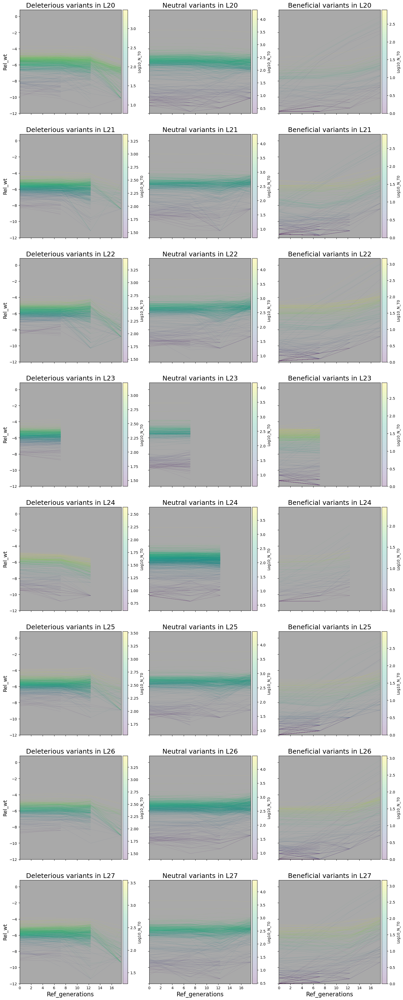

In [183]:
plot_freq_traj(F3F4_300_spiked, 'Rel_wt', 'Ref_generations', time_dicts[2], 's_T0toT3_Ref', 0.05, 'N_T0')

There is clearly a problem here... Variants are seen in L23 much later than T1! **This is because the T2 sample does not exist (failed PCR) for L23!!**

Let's generate the same figure for the F3F4 and CDS 150 paired-end samples

In [186]:
F3F4_150_5FC = freqs_150_F3F4[freqs_150_F3F4['Library'].isin(libs_with5FC)].copy().reset_index(drop=True)
CDS_150_5FC = freqs_150_CDS[freqs_150_CDS['Library'].isin(libs_spiked)].copy().reset_index(drop=True)

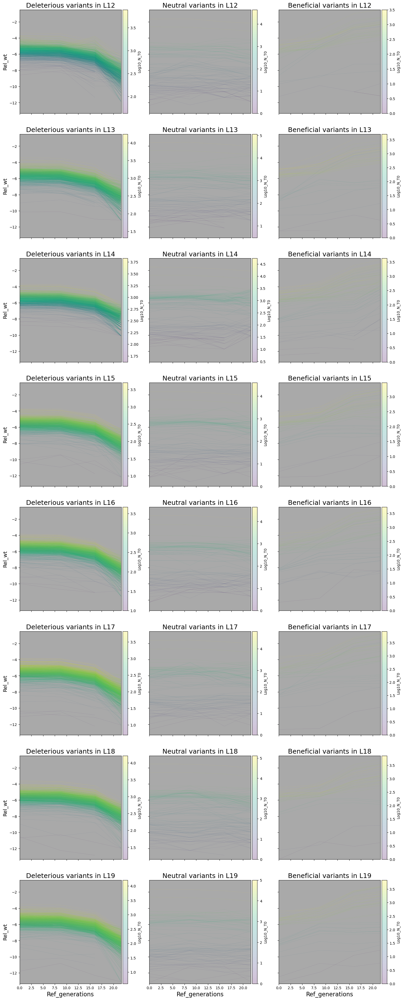

In [187]:
# For the F3F4 libraries
plot_freq_traj(F3F4_150_5FC, 'Rel_wt', 'Ref_generations', time_dicts[1], 's_T0toT3_Ref', 0.05, 'N_T0')

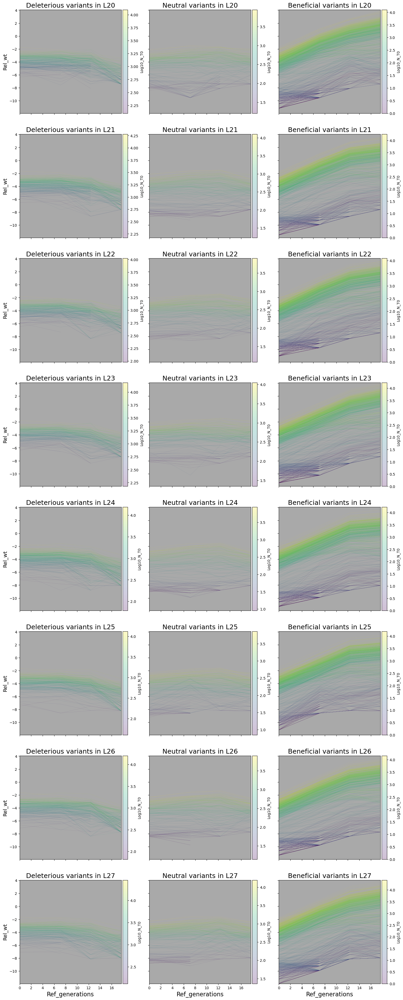

In [188]:
# For the CDS libraries
plot_freq_traj(CDS_150_5FC, 'Rel_wt', 'Ref_generations', time_dicts[2], 's_T0toT3_Ref', 0.05, 'N_T0')

We can clearly see that the F3F4 data from the original 150 paired-end sequencing is simply not usable. The CDS data - benefiting from an independent WT reference - is however mostly fine from T0 to T3!

The T0->T2 interval will still be used for comparisons with Després et al. (2022).

## Should all replicates be kept?

For the 300 paired-end sequencing of the F3-F4 libraries, four instances of problematic shifts in WT-relative frequencies between T2 and T3 were observed. Does this mean that the corresponding libraries remain biased towards negative values at T2?

Adding information on which variants are within the desired F3F4 mutated region (later used to color points)

In [194]:
F3F4_300_coords = (52, 205)
s_300['In F3F4'] = s_300['Position'].apply(lambda x: F3F4_300_coords[0] <= x <= F3F4_300_coords[1])

### Distributions of s through time for F3F4 300 paired-end samples

In [196]:
# Selecting samples with 5-FC and without spike-ins
s_300_5FC = s_300[(s_300['Condition'] == 'WITH_5FC') & (s_300['With_CDS_spikeins'] == False)].copy().reset_index(drop=True)

# Obtaining df of selection coefficients where the time interval is in a column (to be used as hue)
time_int_rename = {'s_T0toT1_Ref':'T0-T1', 's_T0toT2_Ref':'T0-T2', 's_T0toT3_Ref':'T0-T3'}
s_300_by_timepoint = s_300_5FC[['Library', 'Genotype', 'In F3F4', 'Bio_rep', 'Tech_rep', 's_T0toT1_Ref', 's_T0toT2_Ref', 's_T0toT3_Ref']].copy()
s_300_by_timepoint = s_300_by_timepoint.rename(columns=time_int_rename)
s_300_by_timepoint = pd.melt(s_300_by_timepoint, id_vars=['Library', 'Genotype', 'In F3F4', 'Bio_rep', 'Tech_rep'],
                             value_vars=['T0-T1', 'T0-T2', 'T0-T3'],
                             var_name='Time interval', value_name='Selection coefficients')

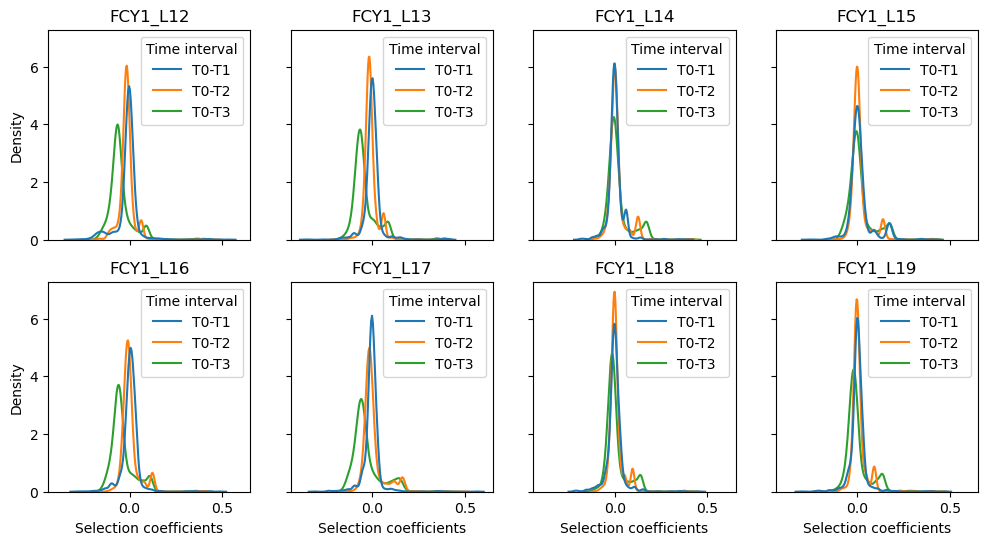

In [197]:
# Plotting the distributions through time
# Note, these distributions include secondary mutations outside F3F4
fig, axs = plt.subplots(2, 4, figsize=(12, 6), sharex=True, sharey=True)

ax_row = 0
ax_col = 0

for lib_name in ['FCY1_L12', 'FCY1_L13', 'FCY1_L14', 'FCY1_L15',
                'FCY1_L16', 'FCY1_L17', 'FCY1_L18', 'FCY1_L19']:
    lib_subset = s_300_by_timepoint[s_300_by_timepoint['Library'] == lib_name].copy().reset_index(drop=True)
    sns.kdeplot(data=lib_subset, x='Selection coefficients', hue='Time interval', hue_order=['T0-T1', 'T0-T2', 'T0-T3'],
               ax=axs[ax_row, ax_col])
    axs[ax_row, ax_col].set_title(f'{lib_name}', fontsize=12)

    if ax_col == 3:
        ax_row += 1
        ax_col = 0

    else:
        ax_col += 1

In [373]:
s_300_by_timepoint[['Library', 'Time interval', 'Selection coefficients']].groupby(by=['Library', 'Time interval'], as_index=False).median()

,Library,Time interval,Selection coefficients
0,FCY1_L12,T0-T1,-0.004261
1,FCY1_L12,T0-T2,-0.015998
2,FCY1_L12,T0-T3,-0.062663
3,FCY1_L13,T0-T1,0.000403
4,FCY1_L13,T0-T2,-0.014652
5,FCY1_L13,T0-T3,-0.059971
6,FCY1_L14,T0-T1,-0.000305
7,FCY1_L14,T0-T2,0.002073
8,FCY1_L14,T0-T3,-0.001805
9,FCY1_L15,T0-T1,0.001806


The T0-T2 selection coefficients display a noticeable shift towards negative values in the four libraries which are clearly biased at T3. For this reason, **only libraries 14, 15, 18 and 19** will be kept for final estimation of fitness effects. 

This choice implies that we define "biased" replicates as samples where median s < -0.05 at T3 (for comparison with simulations in Sim_muts_resist.ipynb).

#### Same distributions for F3F4 variants in samples with CDS spike-ins

In [200]:
# Selecting samples with 5-FC and without spike-ins
s_300_spike = s_300[(s_300['Condition'] == 'WITH_5FC') & (s_300['With_CDS_spikeins'] == True)].copy().reset_index(drop=True)

# Obtaining df of selection coefficients where the time interval is in a column (to be used as hue)
s_300spike_by_time = s_300_spike[['Library', 'Genotype', 'In F3F4', 'Bio_rep', 'Tech_rep', 's_T0toT1_Ref', 's_T0toT2_Ref', 's_T0toT3_Ref']].copy()
s_300spike_by_time = s_300spike_by_time.rename(columns=time_int_rename)
s_300spike_by_time = pd.melt(s_300spike_by_time, id_vars=['Library', 'Genotype', 'In F3F4', 'Bio_rep', 'Tech_rep'],
                             value_vars=['T0-T1', 'T0-T2', 'T0-T3'],
                             var_name='Time interval', value_name='Selection coefficients')

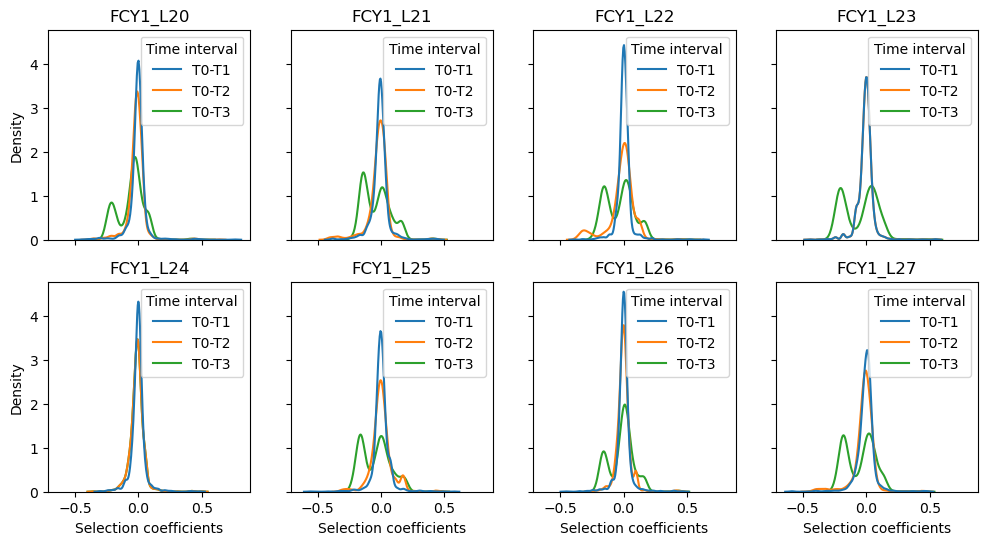

In [201]:
# Plotting the distributions through time
# Note, these distributions include secondary mutations outside F3F4
fig, axs = plt.subplots(2, 4, figsize=(12, 6), sharex=True, sharey=True)

ax_row = 0
ax_col = 0

for lib_name in ['FCY1_L20', 'FCY1_L21', 'FCY1_L22', 'FCY1_L23',
                'FCY1_L24', 'FCY1_L25', 'FCY1_L26', 'FCY1_L27']:
    lib_subset = s_300spike_by_time[s_300spike_by_time['Library'] == lib_name].copy().reset_index(drop=True)
    sns.kdeplot(data=lib_subset, x='Selection coefficients', hue='Time interval', hue_order=['T0-T1', 'T0-T2', 'T0-T3'],
               ax=axs[ax_row, ax_col])
    axs[ax_row, ax_col].set_title(f'{lib_name}', fontsize=12)

    if ax_col == 3:
        ax_row += 1
        ax_col = 0

    else:
        ax_col += 1

A similar shift is not visible at T2 for F3F4 libraries with spike-ins. In this case, all samples seem equally good.

#### Also for the CDS variants

In [204]:
# Selecting samples with 5-FC and without spike-ins
s_5FC_CDS = s_150_CDS[s_150_CDS['Condition'] == 'WITH_5FC'].copy().reset_index(drop=True)

# Obtaining df of selection coefficients where the time interval is in a column (to be used as hue)
s_5FC_CDS_by_time = s_5FC_CDS[['Library', 'Genotype', 'Bio_rep', 'Tech_rep', 's_T0toT1_Ref', 's_T0toT2_Ref', 's_T0toT3_Ref']].copy()
s_5FC_CDS_by_time = s_5FC_CDS_by_time.rename(columns=time_int_rename)
s_5FC_CDS_by_time = pd.melt(s_5FC_CDS_by_time, id_vars=['Library', 'Genotype', 'Bio_rep', 'Tech_rep'],
                             value_vars=['T0-T1', 'T0-T2', 'T0-T3'],
                             var_name='Time interval', value_name='Selection coefficients')

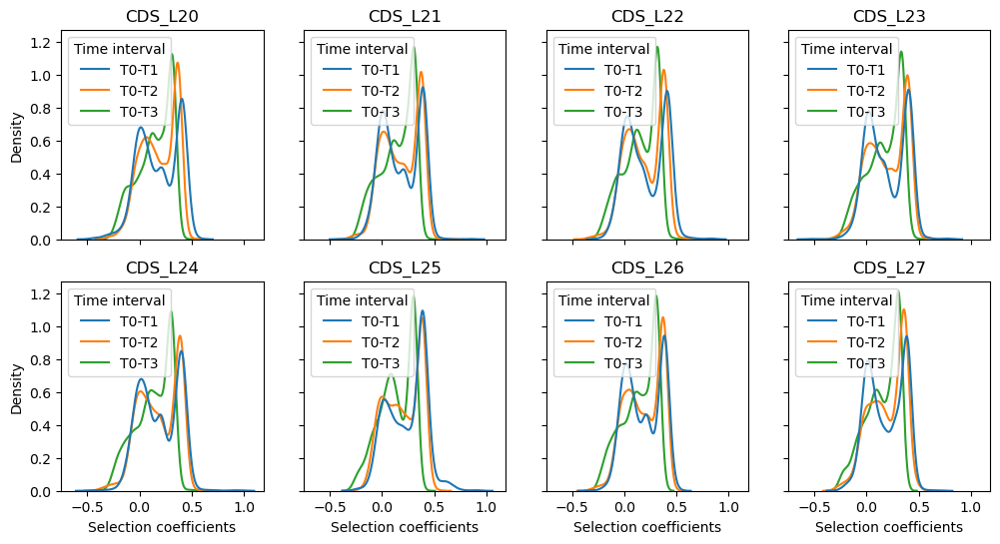

In [205]:
# Plotting the distributions through time
fig, axs = plt.subplots(2, 4, figsize=(12, 6), sharex=True, sharey=True)

ax_row = 0
ax_col = 0

for lib_name in ['CDS_L20', 'CDS_L21', 'CDS_L22', 'CDS_L23',
                'CDS_L24', 'CDS_L25', 'CDS_L26', 'CDS_L27']:
    lib_subset = s_5FC_CDS_by_time[s_5FC_CDS_by_time['Library'] == lib_name].copy().reset_index(drop=True)
    sns.kdeplot(data=lib_subset, x='Selection coefficients', hue='Time interval', hue_order=['T0-T1', 'T0-T2', 'T0-T3'],
               ax=axs[ax_row, ax_col])
    axs[ax_row, ax_col].set_title(f'{lib_name}', fontsize=12)

    if ax_col == 3:
        ax_row += 1
        ax_col = 0

    else:
        ax_col += 1

There are some shifts through time, but they appear mostly consistent across the different samples

### Identifying samples to be used in downstream analysis

For the 300 paired-end sequencing of F3F4 libraries (without spike-ins), samples 12, 13, 16 and 17 are set to be 'ignored'.

For the 150 paired-end sequencing of the same libraries, all samples are equally bad (as shown by log frequencies through time). As such, no selection of samples is performed.

In [210]:
s_300['To_ignore'] = s_300['Library'].apply(lambda x: x in ['FCY1_L12', 'FCY1_L13', 'FCY1_L16', 'FCY1_L17'])

## Choosing the abundance thresholds

Now that we know which final timepoint to focus on, we can choose an abundance threshold (in reads) based on which we will filter variants. To ensure that we do not miss any resistance-conferring secondary mutations, this threshold will be applied "two-way". All variants which have at least n reads at T0 or T2 will be kept in the final dataset.

#### First for the F3F4 300 paired-end samples

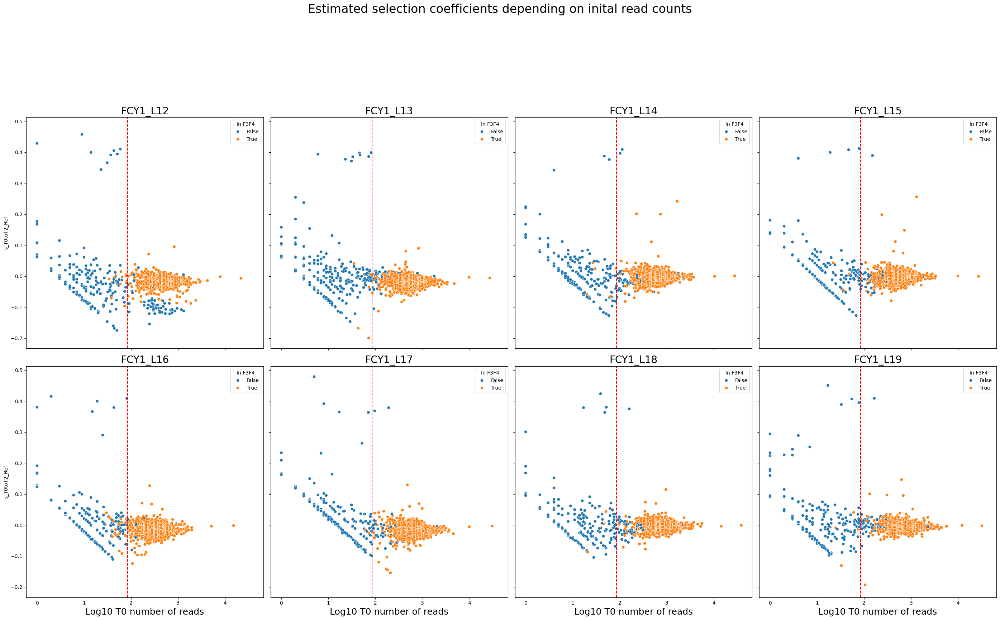

In [214]:
# First without spike-ins, using the OLS regression s coefficients
FCY1_5FC = ['FCY1_' + lib_num for lib_num in libs_with5FC]

s_300['Log10_N_T0'] = np.log10(s_300['N_T0'])
s_300['Log10_N_T3'] = np.log10(s_300['N_T3'])

fig, axs = plt.subplots(2, 4, figsize=(28, 15), sharex=True, sharey=True)
row = 0
col = 0

for lib in FCY1_5FC:
    data_lib = s_300[s_300['Library'] == lib].copy().reset_index(drop=True)
    sns.scatterplot(data=data_lib, x='Log10_N_T0', y='s_T0toT2_Ref',
                    hue='In F3F4', ax=axs[row, col])
    axs[row, col].axvline(x=np.log10(85), c='red', linestyle='--')
    axs[row, col].set_title(f'{lib}', fontsize=20)
    axs[row, col].set_xlabel('Log10 T0 number of reads', fontsize=18)

    col += 1

    if col == 4:
        row += 1
        col = 0

fig.suptitle('Estimated selection coefficients depending on inital read counts', fontsize=24, y=1.15)
plt.tight_layout()

Seems like a threshold at 85 reads would work well! Does it look the same when using the T2/T0 log ratios?

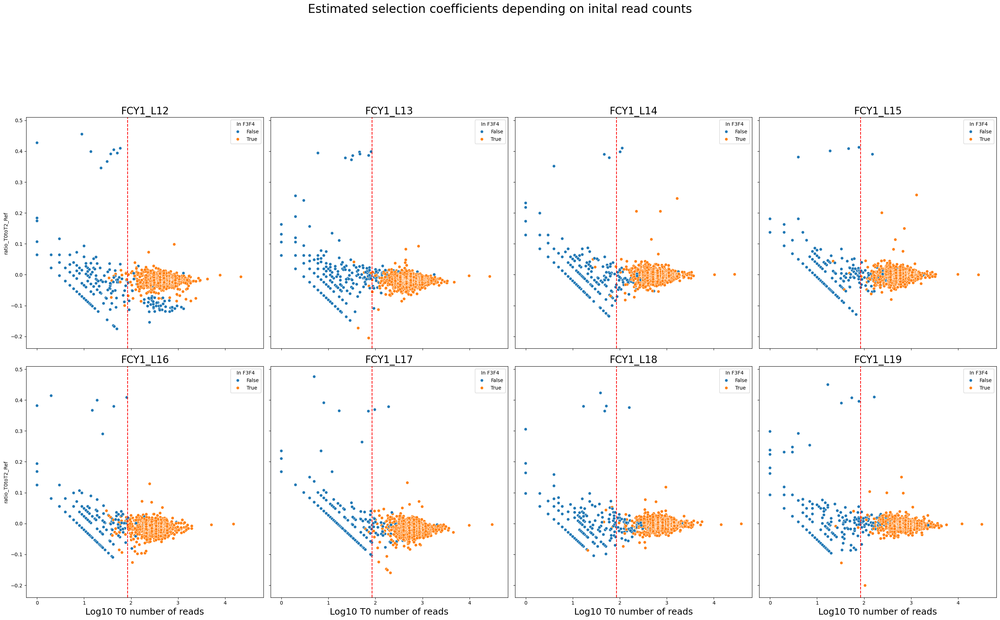

In [216]:
fig, axs = plt.subplots(2, 4, figsize=(28, 15), sharex=True, sharey=True)
row = 0
col = 0

for lib in FCY1_5FC:
    data_lib = s_300[s_300['Library'] == lib].copy().reset_index(drop=True)
    sns.scatterplot(data=data_lib, x='Log10_N_T0', y='ratio_T0toT2_Ref',
                    hue='In F3F4', ax=axs[row, col])
    axs[row, col].axvline(x=np.log10(85), c='red', linestyle='--')
    axs[row, col].set_title(f'{lib}', fontsize=20)
    axs[row, col].set_xlabel('Log10 T0 number of reads', fontsize=18)

    col += 1

    if col == 4:
        row += 1
        col = 0

fig.suptitle('Estimated selection coefficients depending on inital read counts', fontsize=24, y=1.15)
plt.tight_layout()

**So our two-way threshold for the 300 paired-end F3F4 library will be set to 85 reads, at T0 OR T3**

Producing the same plot using the 'Log10_N_T3' column (not kept as part of the current notebook) shows that only high-abundance F3F4 variants or extremely beneficial secondary mutations pass the threshold at T3. As such, implementing this threshold in a "two-way" manner guarantees that resistance-conferring mutations are kept, without keeping low-confidence variants in the final set.

Just to be sure, does this threshold also work for the spiked (with CDS mutants) version of the same libraries?

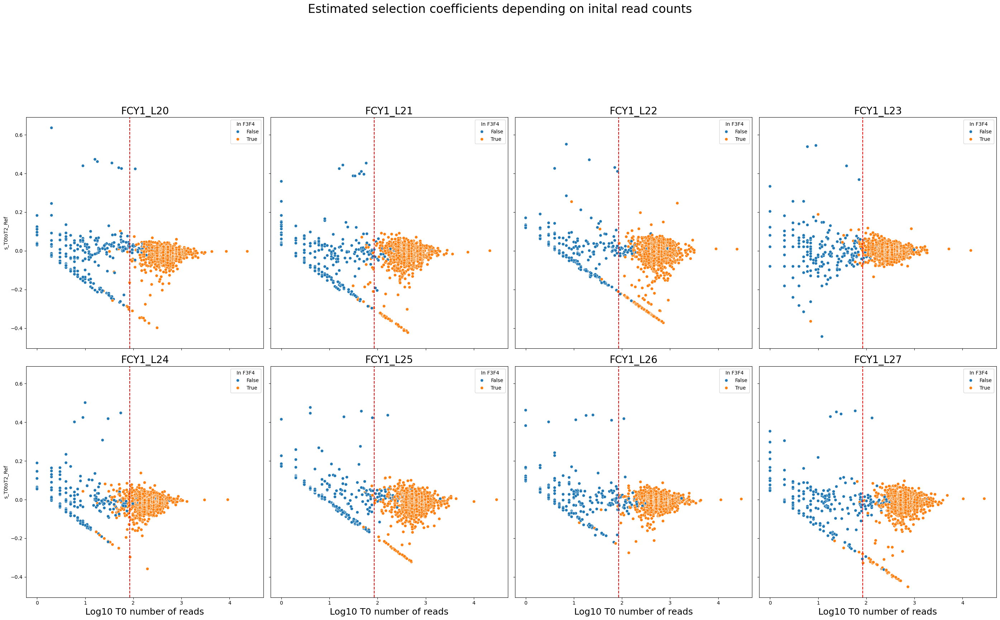

In [220]:
FCY1_spiked = ['FCY1_' + lib_num for lib_num in libs_spiked]

# Only for the OLS regression selection coefficients
fig, axs = plt.subplots(2, 4, figsize=(28, 15), sharex=True, sharey=True)
row = 0
col = 0

for lib in FCY1_spiked:
    data_lib = s_300[s_300['Library'] == lib].copy().reset_index(drop=True)
    sns.scatterplot(data=data_lib, x='Log10_N_T0', y='s_T0toT2_Ref',
                    hue='In F3F4', ax=axs[row, col])
    axs[row, col].axvline(x=np.log10(85), c='red', linestyle='--')
    axs[row, col].set_title(f'{lib}', fontsize=20)
    axs[row, col].set_xlabel('Log10 T0 number of reads', fontsize=18)

    col += 1

    if col == 4:
        row += 1
        col = 0

fig.suptitle('Estimated selection coefficients depending on inital read counts', fontsize=24, y=1.15)
plt.tight_layout()


The coverage of the F3F4 mutations is highly variable within these libraries, so much that setting a threshold of absolute read counts seems hazardous... This highlights that these libraries should not be used to estimate the effect of F3F4 mutations.

#### Second for the CDS 150 paired-end samples

Need to identify positions which were included in the CDS spike-ins:

In [224]:
# Codons selected for the spike-ins
codon_positions = [65, 69, 70, 71, 74, 75, 76, 83, 89, 93, 95, 96, 99, 100, 101]

# Identifying variants which only contain substitutions at only one of these codons
s_150_CDS['Included_position'] = s_150_CDS['Position (codon)'].apply(lambda x: x in codon_positions)
s_150_CDS['In spike-in'] = s_150_CDS['Included_position'] & (s_150_CDS['Mutation types'] == "['Substitution']")

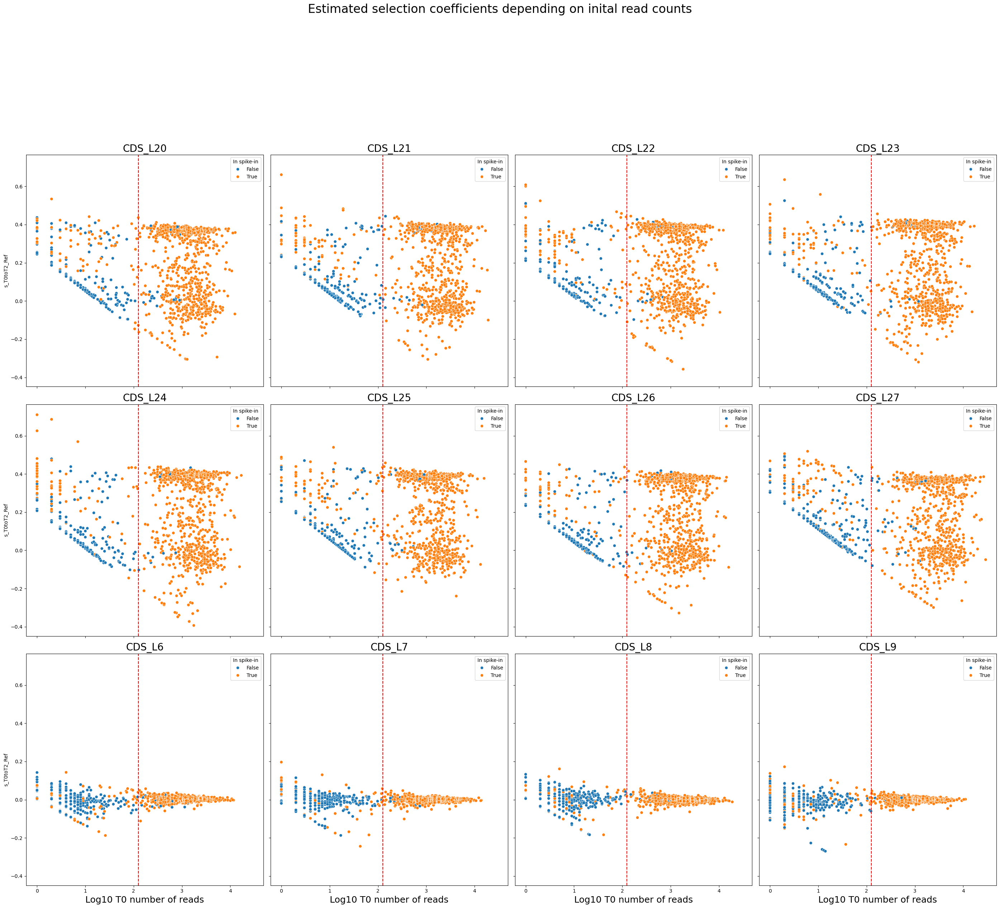

In [225]:
s_150_CDS['Log10_N_T0'] = np.log10(s_150_CDS['N_T0'])

fig, axs = plt.subplots(3, 4, figsize=(28, 22), sharex=True, sharey=True)
row = 0
col = 0

libs_CDS = list(s_150_CDS['Library'].unique())
libs_CDS.sort()

for lib in libs_CDS:
    data_lib = s_150_CDS[s_150_CDS['Library'] == lib].copy().reset_index(drop=True)
    sns.scatterplot(data=data_lib, x='Log10_N_T0', y='s_T0toT2_Ref',
                    hue='In spike-in', ax=axs[row, col])
    axs[row, col].axvline(x=np.log10(125), c='red', linestyle='--')
    axs[row, col].set_title(f'{lib}', fontsize=20)
    axs[row, col].set_xlabel('Log10 T0 number of reads', fontsize=18)

    col += 1

    if col == 4:
        row += 1
        col = 0

fig.suptitle('Estimated selection coefficients depending on inital read counts', fontsize=24, y=1.15)
plt.tight_layout()

**We will use a more stringent threshold of 125 reads for these libraries**

#### Third, for the F3F4 150 paired-end samples

In [228]:
F3F4_150_coords = (1, 154)
s_150_F3F4['In F3F4'] = s_150_F3F4['Position'].apply(lambda x: F3F4_150_coords[0] <= x <= F3F4_150_coords[1])

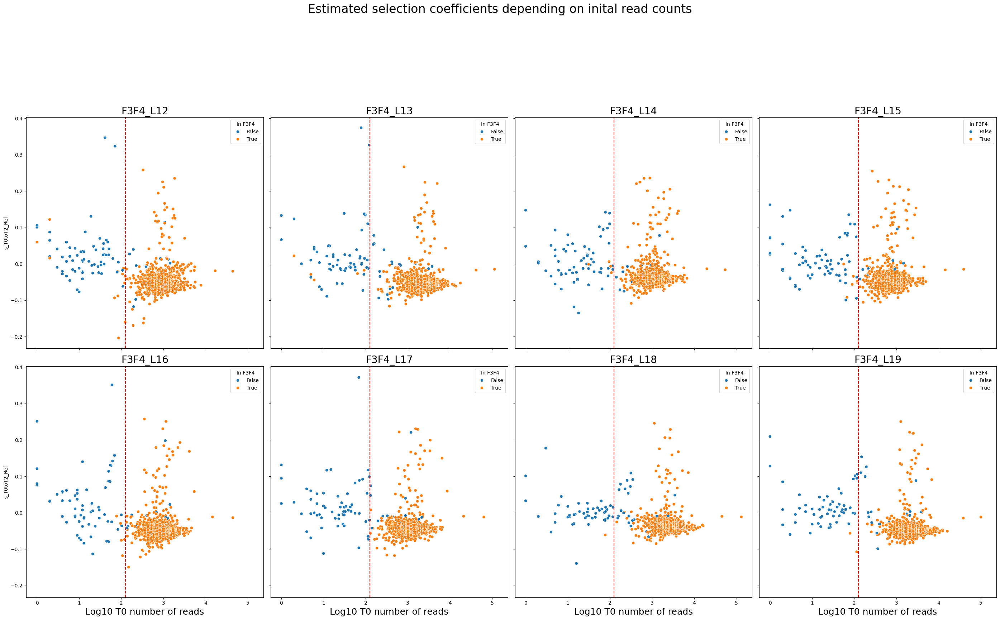

In [229]:
# First without spike-ins, using the OLS regression s coefficients
F3F4_5FC = ['F3F4_' + lib_num for lib_num in libs_with5FC]

s_150_F3F4['Log10_N_T0'] = np.log10(s_150_F3F4['N_T0'])

fig, axs = plt.subplots(2, 4, figsize=(28, 15), sharex=True, sharey=True)
row = 0
col = 0

for lib in F3F4_5FC:
    data_lib = s_150_F3F4[s_150_F3F4['Library'] == lib].copy().reset_index(drop=True)
    sns.scatterplot(data=data_lib, x='Log10_N_T0', y='s_T0toT2_Ref',
                    hue='In F3F4', ax=axs[row, col])
    axs[row, col].axvline(x=np.log10(125), c='red', linestyle='--')
    axs[row, col].set_title(f'{lib}', fontsize=20)
    axs[row, col].set_xlabel('Log10 T0 number of reads', fontsize=18)

    col += 1

    if col == 4:
        row += 1
        col = 0

fig.suptitle('Estimated selection coefficients depending on inital read counts', fontsize=24, y=1.15)
plt.tight_layout()

**Again, a more stringent threshold of 125 reads will be used here.**

What do the same graphs look like for the libraries with CDS spike-ins?

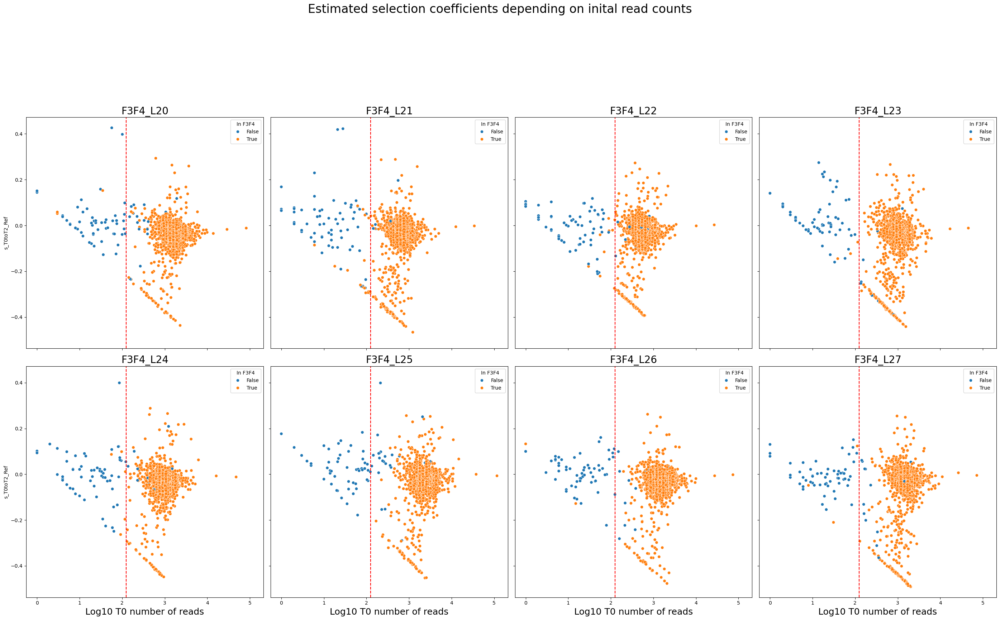

In [232]:
# Second with spike-ins, using the OLS regression s coefficients
F3F4_spiked = ['F3F4_' + lib_num for lib_num in libs_spiked]

fig, axs = plt.subplots(2, 4, figsize=(28, 15), sharex=True, sharey=True)
row = 0
col = 0

for lib in F3F4_spiked:
    data_lib = s_150_F3F4[s_150_F3F4['Library'] == lib].copy().reset_index(drop=True)
    sns.scatterplot(data=data_lib, x='Log10_N_T0', y='s_T0toT2_Ref',
                    hue='In F3F4', ax=axs[row, col])
    axs[row, col].axvline(x=np.log10(125), c='red', linestyle='--')
    axs[row, col].set_title(f'{lib}', fontsize=20)
    axs[row, col].set_xlabel('Log10 T0 number of reads', fontsize=18)

    col += 1

    if col == 4:
        row += 1
        col = 0

fig.suptitle('Estimated selection coefficients depending on inital read counts', fontsize=24, y=1.15)
plt.tight_layout()

Setting a threshold seems a bit hazardous again here, but the distribution is much less biased (towards negative values) that for the corresponding F3F4 samples without spike-ins.

## Filtering all selection coefficients sets based on the chosen abundance threshold

The final abundance thresholds (based on graphs in the previous section) are:

For F3F4 300 paired-end (all libraries): **85 reads**

For CDS 150 paired-end: **85 reads**

For F3F4 150 paired-end (all libraries): **125 reads**

Within each library, variants which are seen at least as many times **at T0 or T3** are kept for further analysis:

In [240]:
s_300_filter = s_300[(s_300['N_T0'] >= 85) | (s_300['N_T3'] >= 85)].copy().reset_index(drop=True)

s_150_CDS_filter = s_150_CDS[(s_150_CDS['N_T0'] >= 125) | (s_150_CDS['N_T3'] >= 125)].copy().reset_index(drop=True)

s_150_F3F4_filter = s_150_F3F4[(s_150_F3F4['N_T0'] >= 125) | (s_150_F3F4['N_T3'] >= 125)].copy().reset_index(drop=True)

## Choosing the best selection coefficients

Now that we know which final generation to use and that variants have been filtered, let's compare the two approaches used to compute selection coefficients.

The between-libraries correlations are compared for the OLS regression and the T2/T0 log ratios. The measure that seems more reproducible across libraries will be chosen for further analysis.

Only the F3F4 300 paired-end and CDS 150-paired samples are considered. In addition, we will focus on the selection coefficients scaled according to the reference generation time.

#### F3F4 variants

In [326]:
s_300_ols = s_300_filter[['Library', 'Genotype', 's_T0toT2_Ref']].copy().pivot(columns='Library', index='Genotype', values='s_T0toT2_Ref')
s_300_ratio = s_300_filter[['Library', 'Genotype', 'ratio_T0toT2_Ref']].copy().pivot(columns='Library', index='Genotype', values='ratio_T0toT2_Ref')

In [328]:
libs_include = libs_with5FC + libs_spiked
libs_include = ['FCY1_' + lib_id for lib_id in libs_include]

In [330]:
# Excluding the samples without 5-FC
libs_include = libs_with5FC + libs_spiked
libs_include = ['FCY1_' + lib_id for lib_id in libs_include]

# Preparing dfs to store all the pearson and spearman correlations
ols_pearson = pd.DataFrame(index=libs_include, columns=libs_include)
ols_spearman = ols_pearson.copy()

ratio_pearson = ols_pearson.copy()
ratio_spearman = ols_pearson.copy()

# Computing the correlation
for lib_a in ols_pearson.columns:
    
    # Whenever L23 is encountered, it needs to be skipped
    # The T2 samples does not exist for this culture
    if lib_a == 'FCY1_L23':
        continue
    
    for lib_b in ols_pearson.columns:
        
        if lib_b == 'FCY1_L23':
            continue
        
        
        if lib_a == lib_b:
            ols_subset = s_300_ols[[lib_a]].copy().dropna().reset_index(drop=True)
            ratio_subset = s_300_ratio[[lib_a]].copy().dropna().reset_index(drop=True)

        elif lib_a != lib_b:
            ols_subset = s_300_ols[[lib_a, lib_b]].copy().dropna().reset_index(drop=True)
            ratio_subset = s_300_ratio[[lib_a, lib_b]].copy().dropna().reset_index(drop=True)

        # OLS pearson
        pearsonr_ols = stats.pearsonr(ols_subset[lib_a], ols_subset[lib_b])[0]
        ols_pearson.at[lib_a, lib_b] = pearsonr_ols
        
        # OLS spearman
        spearmanr_ols = stats.spearmanr(ols_subset[lib_a], ols_subset[lib_b])[0]
        ols_spearman.at[lib_a, lib_b] = spearmanr_ols
        
        # ratio pearson
        pearsonr_ratio = stats.pearsonr(ratio_subset[lib_a], ratio_subset[lib_b])[0]
        ratio_pearson.at[lib_a, lib_b] = pearsonr_ratio
        
        # ratio spearman
        spearmanr_ratio = stats.spearmanr(ratio_subset[lib_a], ratio_subset[lib_b])[0]
        ratio_spearman.at[lib_a, lib_b] = spearmanr_ratio

In [331]:
# Removing the L23 cells with NaNs
for corr_table in [ols_pearson, ols_spearman,
                  ratio_pearson, ratio_spearman]:
    corr_table.drop(index=['FCY1_L23'], columns=['FCY1_L23'],
                   inplace=True)

Text(0.5, 1.0, 'Log ratios - Spearman')

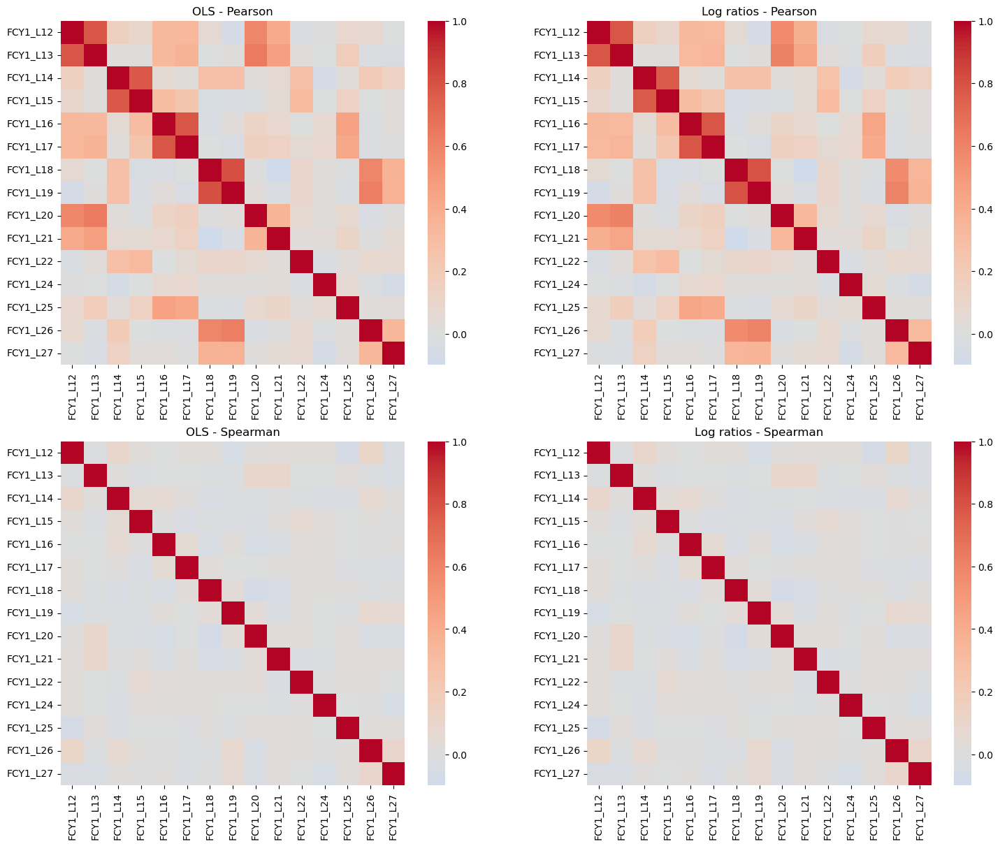

In [334]:
# Plotting the matrices of correlation coefficients
max_corr = np.max([ols_pearson.values, ols_spearman.values, 
                   ratio_pearson.values, ratio_spearman.values])

min_corr = np.min([ols_pearson.values, ols_spearman.values, 
                   ratio_pearson.values, ratio_spearman.values])


fig, axs = plt.subplots(2, 2, figsize=(15, 12), constrained_layout=True)

sns.heatmap(ols_pearson.infer_objects(), vmin=min_corr, vmax=max_corr, center=0,
            cmap='coolwarm', ax=axs[0,0], square=True)
axs[0,0].set_title('OLS - Pearson')

sns.heatmap(ratio_pearson.infer_objects(), vmin=min_corr, vmax=max_corr, center=0,
            cmap='coolwarm', ax=axs[0,1], square=True)
axs[0,1].set_title('Log ratios - Pearson')

sns.heatmap(ols_spearman.infer_objects(), vmin=min_corr, vmax=max_corr, center=0,
            cmap='coolwarm', ax=axs[1,0], square=True)
axs[1,0].set_title('OLS - Spearman')

sns.heatmap(ratio_spearman.infer_objects(), vmin=min_corr, vmax=max_corr, center=0,
            cmap='coolwarm', ax=axs[1,1], square=True)
axs[1,1].set_title('Log ratios - Spearman')

There is no obvious difference between the replicability of the two types of selection coefficients. The fact that there almost no substantial correlations highlights that there were likely no measurable fitness effects among the F3F4 variants.

Let's make a few scatterplots as validation:

In [337]:
lib_pairs = [('FCY1_L12', 'FCY1_L13'), ('FCY1_L15', 'FCY1_L16'),
            ('FCY1_L18', 'FCY1_L19')]

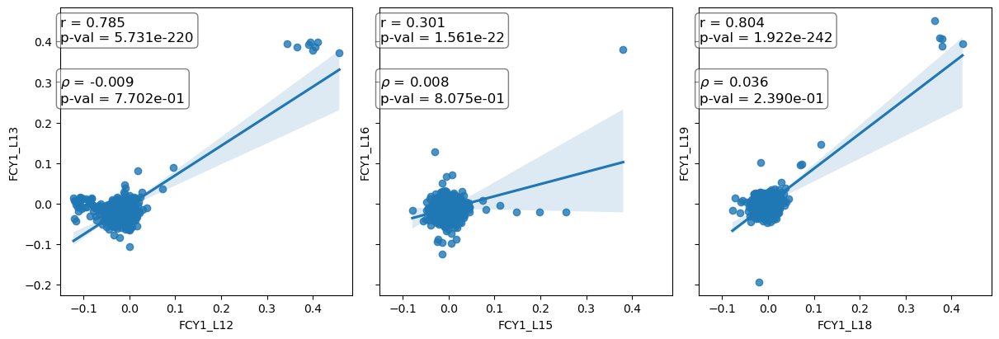

In [338]:
# First, for OLS selection coefficients
fig, axs = plt.subplots(1, 3, figsize=(12, 4), constrained_layout=True,
                       sharex=True, sharey=True)
ax_num = 0

for lib_comb in lib_pairs:
    ols_subset = s_300_ols[[lib_comb[0], lib_comb[1]]].copy().dropna().reset_index(drop=True)
    
    sns.regplot(data=ols_subset, x=lib_comb[0], y=lib_comb[1], ax=axs[ax_num])
    
    pearson_coeff = stats.pearsonr(ols_subset[lib_comb[0]], ols_subset[lib_comb[1]])
    axs[ax_num].annotate(r"r = "f'{round(pearson_coeff[0], 3)}\np-val = {pearson_coeff[1]:.3e}',
                         (-0.15, 0.40), bbox=dict(boxstyle='round', fc='w', alpha=0.5), fontsize=12)
    
    spearman_coeff = stats.spearmanr(ols_subset[lib_comb[0]], ols_subset[lib_comb[1]])
    axs[ax_num].annotate(r"$\rho$ = "f'{round(spearman_coeff[0], 3)}\np-val = {spearman_coeff[1]:.3e}',
                         (-0.15, 0.25), bbox=dict(boxstyle='round', fc='w', alpha=0.5), fontsize=12)
    
    ax_num += 1

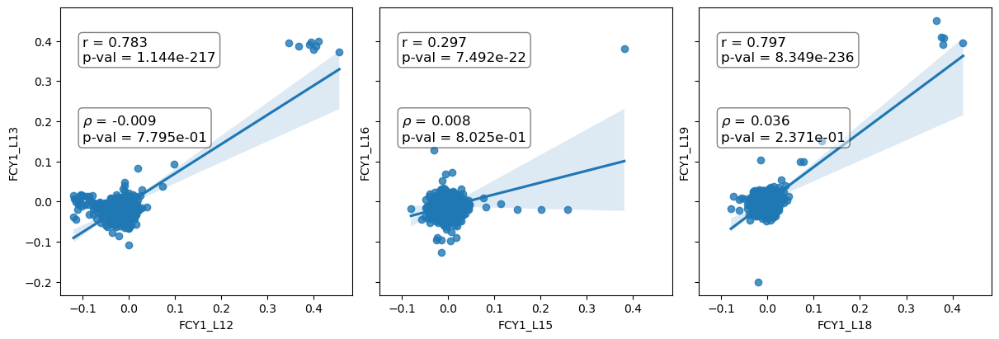

In [344]:
# Second, for the ratio selection coefficients
fig, axs = plt.subplots(1, 3, figsize=(12, 4), constrained_layout=True,
                       sharex=True, sharey=True)
ax_num = 0

for lib_comb in lib_pairs:
    ratio_subset = s_300_ratio[[lib_comb[0], lib_comb[1]]].copy().dropna().reset_index(drop=True)
    
    sns.regplot(data=ratio_subset, x=lib_comb[0], y=lib_comb[1], ax=axs[ax_num])
    
    pearson_coeff = stats.pearsonr(ratio_subset[lib_comb[0]], ratio_subset[lib_comb[1]])
    axs[ax_num].annotate(r"r = "f'{round(pearson_coeff[0], 3)}\np-val = {pearson_coeff[1]:.3e}',
                         (-0.10, 0.35), bbox=dict(boxstyle='round', fc='w', alpha=0.5), fontsize=12)
    
    spearman_coeff = stats.spearmanr(ratio_subset[lib_comb[0]], ratio_subset[lib_comb[1]])
    axs[ax_num].annotate(r"$\rho$ = "f'{round(spearman_coeff[0], 3)}\np-val = {spearman_coeff[1]:.3e}',
                         (-0.10, 0.15), bbox=dict(boxstyle='round', fc='w', alpha=0.5), fontsize=12)
    
    ax_num += 1

In both cases, we mostly see a cloud of points centered around 0. Except for the rare resistance-conferring secondary mutations, it seems that were no **measurable** fitness effects.

#### CDS variants

In [348]:
s_CDS_ols = s_150_CDS_filter[['Library', 'Genotype', 's_T0toT2_Ref']].copy().pivot(columns='Library', index='Genotype', values='s_T0toT2_Ref')
s_CDS_ratio = s_150_CDS_filter[['Library', 'Genotype', 'ratio_T0toT2_Ref']].copy().pivot(columns='Library', index='Genotype', values='ratio_T0toT2_Ref')

In [350]:
# Preparing dfs to store all the pearson and spearman correlations
ols_pearson_CDS = pd.DataFrame(index=s_CDS_ols.columns, columns=s_CDS_ols.columns)
ols_spearman_CDS = ols_pearson_CDS.copy()

ratio_pearson_CDS = ols_pearson_CDS.copy()
ratio_spearman_CDS = ols_pearson_CDS.copy()

# Computing the correlation
for lib_a in ols_pearson_CDS.columns:
    
    for lib_b in ols_pearson_CDS.columns:  
        
        if lib_a == lib_b:
            ols_subset = s_CDS_ols[[lib_a]].copy().dropna().reset_index(drop=True)
            ratio_subset = s_CDS_ratio[[lib_a]].copy().dropna().reset_index(drop=True)

        elif lib_a != lib_b:
            ols_subset = s_CDS_ols[[lib_a, lib_b]].copy().dropna().reset_index(drop=True)
            ratio_subset = s_CDS_ratio[[lib_a, lib_b]].copy().dropna().reset_index(drop=True)

        # OLS pearson
        pearsonr_ols = stats.pearsonr(ols_subset[lib_a], ols_subset[lib_b])[0]
        ols_pearson_CDS.at[lib_a, lib_b] = pearsonr_ols
        
        # OLS spearman
        spearmanr_ols = stats.spearmanr(ols_subset[lib_a], ols_subset[lib_b])[0]
        ols_spearman_CDS.at[lib_a, lib_b] = spearmanr_ols
        
        # ratio pearson
        pearsonr_ratio = stats.pearsonr(ratio_subset[lib_a], ratio_subset[lib_b])[0]
        ratio_pearson_CDS.at[lib_a, lib_b] = pearsonr_ratio
        
        # ratio spearman
        spearmanr_ratio = stats.spearmanr(ratio_subset[lib_a], ratio_subset[lib_b])[0]
        ratio_spearman_CDS.at[lib_a, lib_b] = spearmanr_ratio

Text(0.5, 1.0, 'Log ratios - Spearman')

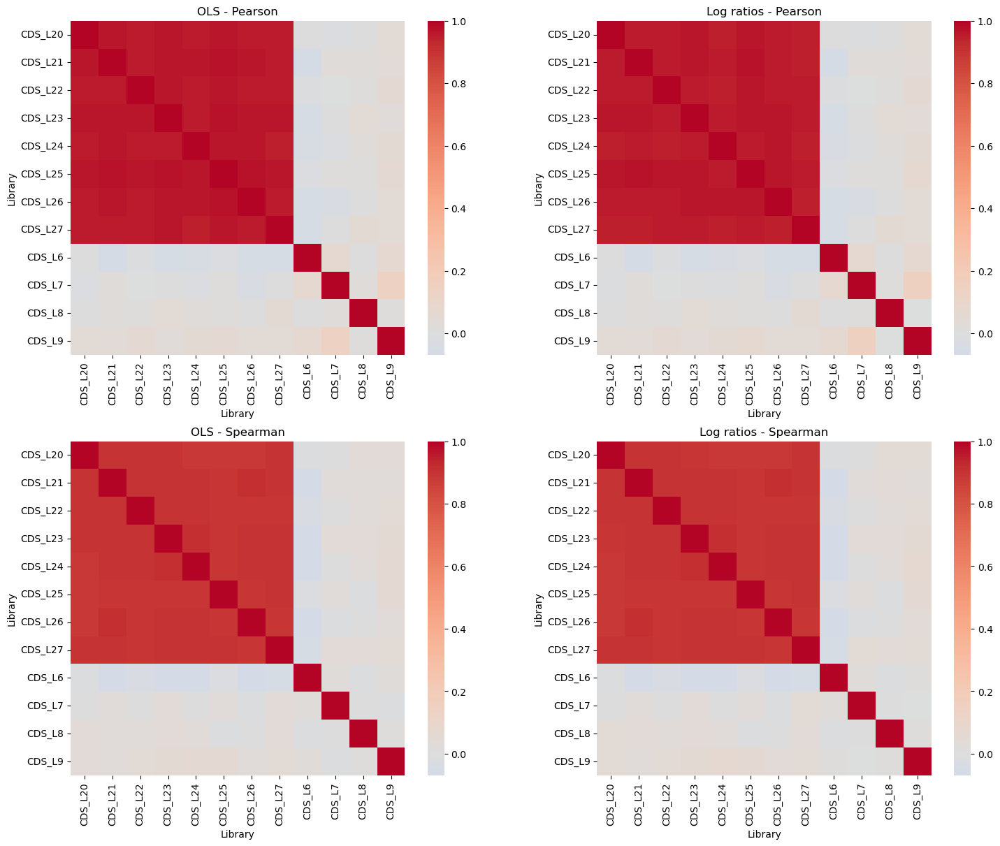

In [351]:
# Plotting the matrices of correlation coefficients
max_corr = np.max([ols_pearson_CDS.values, ols_spearman_CDS.values, 
                   ratio_pearson_CDS.values, ratio_spearman_CDS.values])

min_corr = np.min([ols_pearson_CDS.values, ols_spearman_CDS.values, 
                   ratio_pearson_CDS.values, ratio_spearman_CDS.values])


fig, axs = plt.subplots(2, 2, figsize=(15, 12), constrained_layout=True)

sns.heatmap(ols_pearson_CDS.infer_objects(), vmin=min_corr, vmax=max_corr, center=0,
            cmap='coolwarm', ax=axs[0,0], square=True)
axs[0,0].set_title('OLS - Pearson')

sns.heatmap(ratio_pearson_CDS.infer_objects(), vmin=min_corr, vmax=max_corr, center=0,
            cmap='coolwarm', ax=axs[0,1], square=True)
axs[0,1].set_title('Log ratios - Pearson')

sns.heatmap(ols_spearman_CDS.infer_objects(), vmin=min_corr, vmax=max_corr, center=0,
            cmap='coolwarm', ax=axs[1,0], square=True)
axs[1,0].set_title('OLS - Spearman')

sns.heatmap(ratio_spearman_CDS.infer_objects(), vmin=min_corr, vmax=max_corr, center=0,
            cmap='coolwarm', ax=axs[1,1], square=True)
axs[1,1].set_title('Log ratios - Spearman')

We have very nice replicability for the CDS variants - which have measurable fitness effects!

In [354]:
lib_pairs = [('CDS_L20', 'CDS_L21'), ('CDS_L23', 'CDS_L24'),
            ('CDS_L26', 'CDS_L27'), ('CDS_L6', 'CDS_L7')]

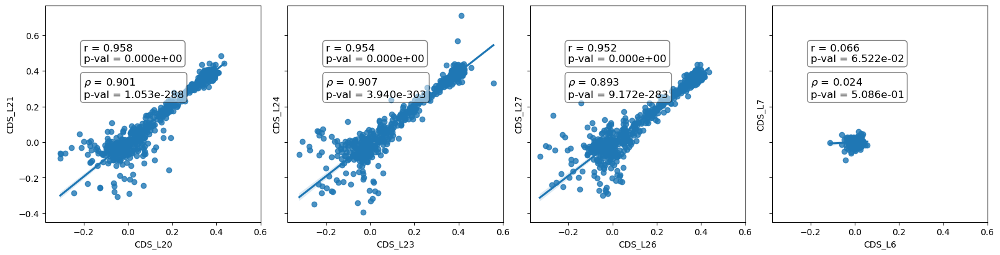

In [357]:
# For the OLS selection coefficients
fig, axs = plt.subplots(1, 4, figsize=(16, 4), constrained_layout=True,
                       sharex=True, sharey=True)
ax_num = 0

for lib_comb in lib_pairs:
    ols_subset = s_CDS_ols[[lib_comb[0], lib_comb[1]]].copy().dropna().reset_index(drop=True)
    
    sns.regplot(data=ols_subset, x=lib_comb[0], y=lib_comb[1], ax=axs[ax_num])
    
    pearson_coeff = stats.pearsonr(ols_subset[lib_comb[0]], ols_subset[lib_comb[1]])
    axs[ax_num].annotate(r"r = "f'{round(pearson_coeff[0], 3)}\np-val = {pearson_coeff[1]:.3e}',
                         (-0.2, 0.45), bbox=dict(boxstyle='round', fc='w', alpha=0.5), fontsize=12)
    
    spearman_coeff = stats.spearmanr(ols_subset[lib_comb[0]], ols_subset[lib_comb[1]])
    axs[ax_num].annotate(r"$\rho$ = "f'{round(spearman_coeff[0], 3)}\np-val = {spearman_coeff[1]:.3e}',
                         (-0.2, 0.25), bbox=dict(boxstyle='round', fc='w', alpha=0.5), fontsize=12)
    
    ax_num += 1

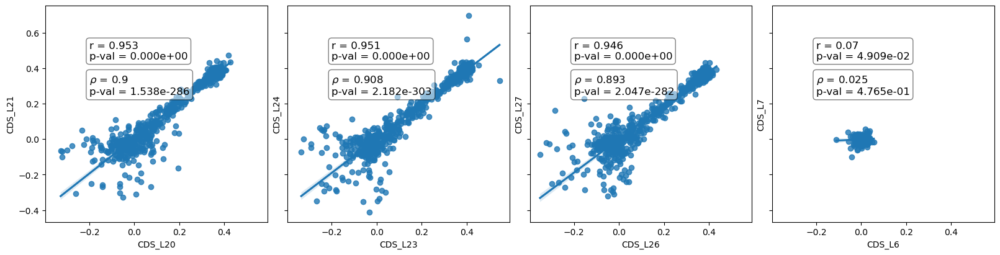

In [359]:
# For the T2/T0 log ratio selection coefficients
fig, axs = plt.subplots(1, 4, figsize=(16, 4), constrained_layout=True,
                       sharex=True, sharey=True)
ax_num = 0

for lib_comb in lib_pairs:
    ratio_subset = s_CDS_ratio[[lib_comb[0], lib_comb[1]]].copy().dropna().reset_index(drop=True)
    
    sns.regplot(data=ratio_subset, x=lib_comb[0], y=lib_comb[1], ax=axs[ax_num])
    
    pearson_coeff = stats.pearsonr(ratio_subset[lib_comb[0]], ratio_subset[lib_comb[1]])
    axs[ax_num].annotate(r"r = "f'{round(pearson_coeff[0], 3)}\np-val = {pearson_coeff[1]:.3e}',
                         (-0.2, 0.45), bbox=dict(boxstyle='round', fc='w', alpha=0.5), fontsize=12)
    
    spearman_coeff = stats.spearmanr(ratio_subset[lib_comb[0]], ratio_subset[lib_comb[1]])
    axs[ax_num].annotate(r"$\rho$ = "f'{round(spearman_coeff[0], 3)}\np-val = {spearman_coeff[1]:.3e}',
                         (-0.2, 0.25), bbox=dict(boxstyle='round', fc='w', alpha=0.5), fontsize=12)
    
    ax_num += 1

It looks like the selection coefficients obtained by OLS linear regression may be slightly more reproducible across samples, when there is actual signal. Let's look at the distributions of correlation coefficients: 

In [362]:
# Keeping only samples with 5-FC, and thus, fitness effects
CDS_5FC = ['CDS_L20', 'CDS_L21', 'CDS_L22', 'CDS_L23',
           'CDS_L24', 'CDS_L25', 'CDS_L26', 'CDS_L27']

ols_pearson_bylib = pd.melt(ols_pearson_CDS.loc[CDS_5FC, CDS_5FC], value_name='pearson_r', var_name='Library')
ols_pearson_bylib['Type_coefficient'] = 'OLS'

ols_spearman_bylib = pd.melt(ols_spearman_CDS.loc[CDS_5FC, CDS_5FC], value_name='spearman_r', var_name='Library')
ols_spearman_bylib['Type_coefficient'] = 'OLS'

ratio_pearson_bylib = pd.melt(ratio_pearson_CDS.loc[CDS_5FC, CDS_5FC], value_name='pearson_r', var_name='Library')
ratio_pearson_bylib['Type_coefficient'] = 'Ratio'

ratio_spearman_bylib = pd.melt(ratio_spearman_CDS.loc[CDS_5FC, CDS_5FC], value_name='spearman_r', var_name='Library')
ratio_spearman_bylib['Type_coefficient'] = 'Ratio'

s_pearson_df = pd.concat([ols_pearson_bylib, ratio_pearson_bylib]).reset_index(drop=True)
s_spearman_df = pd.concat([ols_spearman_bylib, ratio_spearman_bylib]).reset_index(drop=True)

<Axes: xlabel='Library', ylabel='spearman_r'>

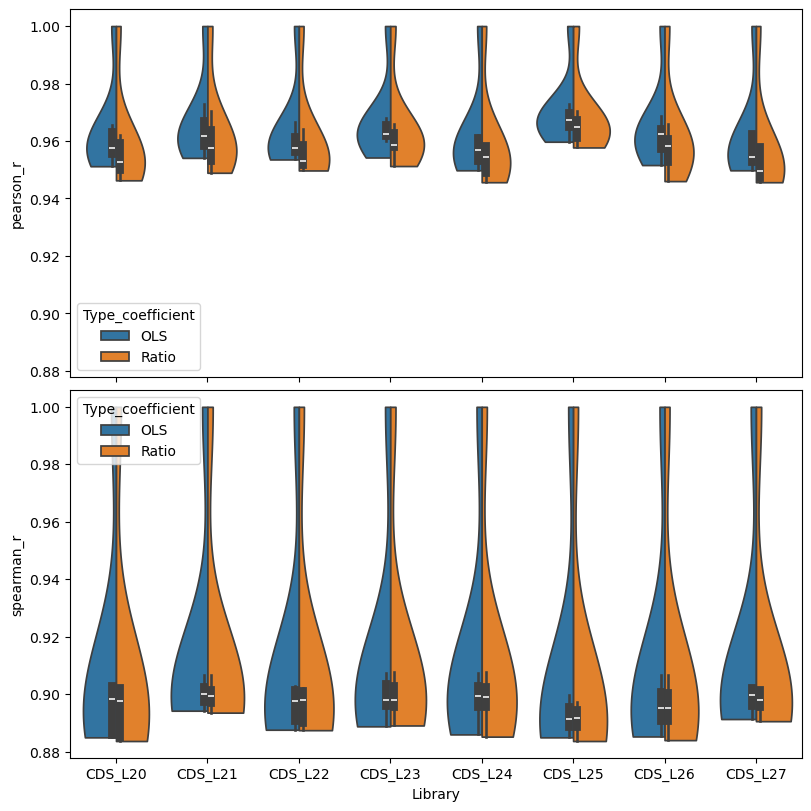

In [364]:
fig, axs = plt.subplots(2, 1, figsize=(8, 8), constrained_layout=True,
                       sharex=True, sharey=True)

pearson_subset = s_pearson_df.copy().reset_index(drop=True).infer_objects()
spearman_subset = s_spearman_df.copy().reset_index(drop=True).infer_objects()

sns.violinplot(data=pearson_subset, x='Library', y='pearson_r', hue='Type_coefficient',
              ax=axs[0], cut=0, split=True)

sns.violinplot(data=spearman_subset, x='Library', y='spearman_r', hue='Type_coefficient',
              ax=axs[1], cut=0, split=True)

In [366]:
# Looking at the medians
pearson_medians = pearson_subset.groupby(by=['Library', 'Type_coefficient'], as_index=False).median()
spearman_medians = spearman_subset.groupby(by=['Library', 'Type_coefficient'], as_index=False).median()

<Axes: xlabel='Library', ylabel='spearman_r'>

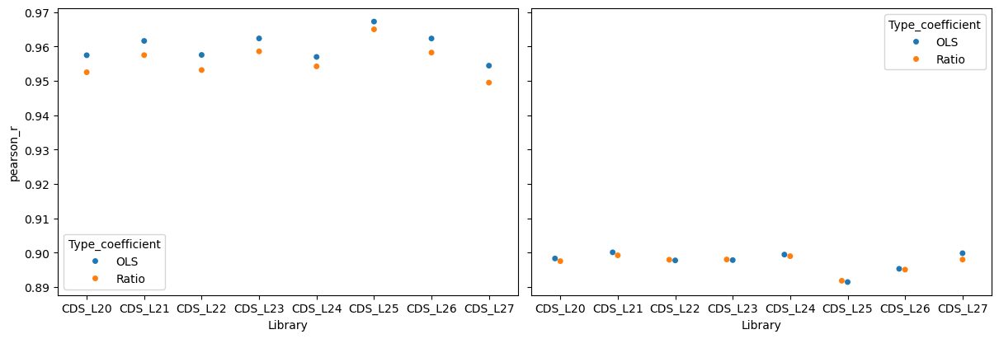

In [368]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4), constrained_layout=True,
                       sharex=True, sharey=True)

sns.swarmplot(data=pearson_medians, x='Library', y='pearson_r', hue='Type_coefficient',
             ax=axs[0])

sns.swarmplot(data=spearman_medians, x='Library', y='spearman_r', hue='Type_coefficient',
             ax=axs[1])

Across all pairwise library comparisons for the CDS variants (the ones for which there is actual signal in our assay), the selection coefficients obtained by OLS linear regression seem slightly more reproducible. They will thus be used for downstream analyses.

## Exporting the final sets of selection coefficients

Two versions of each file are exported: 

1. The "filtered" dataframes with all their 44 columns
2. A "final_s" version which only includes the T0->T2 selection coefficients, obtained by OLS and from the log ratios

In [274]:
# "Filtered" dfs
s_300_filter.to_csv("s_final/s_300_filtered.csv", index=False)
s_150_F3F4_filter.to_csv("s_final/s_150_F3F4_filtered.csv", index=False)
s_150_CDS_filter.to_csv("s_final/s_150_CDS_filtered.csv", index=False)

# "Final_s" dfs
to_drop = ['s_T0toT1_Total', 's_T0toT2_Total', 's_T0toT3_Total', 'intercept_T0toT1_Total', 
           'intercept_T0toT2_Total', 'intercept_T0toT3_Total', 'ratio_T0toT1_Total',
           'ratio_T0toT2_Total', 'ratio_T0toT3_Total', 'intercept_T0toT3_Ref',
           'ratio_T0toT3_Ref', 's_T0toT1_Time', 's_T0toT2_Time', 's_T0toT3_Time', 
           'intercept_T0toT1_Time', 'intercept_T0toT2_Time', 'intercept_T0toT3_Time',
           'ratio_T0toT1_Time','ratio_T0toT2_Time','ratio_T0toT3_Time']
# The 's_T0toT3_Ref' column is actually kept, as it can be useful for some figures

s_300_final = s_300_filter.drop(columns=to_drop)
s_300_final.to_csv("s_final/Final_s_300_F3F4.csv", index=False)
s_150_F3F4_final = s_150_F3F4_filter.drop(columns=to_drop)
s_150_F3F4_final.to_csv("s_final/Final_s_150_F3F4.csv", index=False)
s_150_CDS_final = s_150_CDS_filter.drop(columns=to_drop)
s_150_CDS_final.to_csv("s_final/Final_s_150_CDS.csv", index=False)

In [275]:
pd.read_csv("s_final/Final_s_300_F3F4.csv")

,Library,Genotype,N_T0,freq_T0,N_T3,freq_T3,s_T0toT1_Ref,s_T0toT2_Ref,s_T0toT3_Ref,intercept_T0toT1_Ref,...,Tech_rep,With_CDS_spikeins,Condition,Mutation type,Position,Log_T0,In F3F4,To_ignore,Log10_N_T0,Log10_N_T3
0,FCY1_L5,I-94_1nt_-toT,26352,0.171277,16107.0,0.183583,0.000000,0.003463,0.002992,-1.764473,...,B,False,NO_5FC,Insertion,94,-1.764473,True,False,4.420814,4.207015
1,FCY1_L5,I-62_1nt_-toC,284,0.001846,147.0,0.001675,0.000000,-0.001798,-0.003648,-6.294798,...,B,False,NO_5FC,Insertion,62,-6.294798,True,False,2.453318,2.167317
2,FCY1_L5,I-56_1nt_-toA,284,0.001846,121.0,0.001379,0.000000,-0.028173,-0.014947,-6.294798,...,B,False,NO_5FC,Insertion,56,-6.294798,True,False,2.453318,2.082785
3,FCY1_L5,S-127_1nt_TtoC,286,0.001859,150.0,0.001710,0.000000,0.012858,-0.000640,-6.287781,...,B,False,NO_5FC,Substitution,127,-6.287781,True,False,2.456366,2.176091
4,FCY1_L5,S-211_1nt_GtoT,287,0.001865,319.0,0.003636,0.000000,-0.004554,0.022182,-6.284290,...,B,False,NO_5FC,Substitution,211,-6.284290,False,False,2.457882,2.503791
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25235,FCY1_L24,S-157_1nt_GtoA,211,0.004131,NaN,NaN,0.001998,-0.005235,-0.005235,-5.489231,...,A,True,WITH_5FC,Substitution,157,-5.489231,True,False,2.324282,NaN
25236,FCY1_L24,S-158_1nt_TtoG,211,0.004131,NaN,NaN,-0.023826,-0.102307,-0.102307,-5.489231,...,A,True,WITH_5FC,Substitution,158,-5.489231,True,False,2.324282,NaN
25237,FCY1_L24,D-89_1nt_Cto-,211,0.004131,NaN,NaN,-0.009244,-0.034545,-0.034545,-5.489231,...,A,True,WITH_5FC,Deletion,89,-5.489231,True,False,2.324282,NaN
25238,FCY1_L24,S-172_1nt_GtoC,211,0.004131,NaN,NaN,-0.037345,-0.100320,-0.100320,-5.489231,...,A,True,WITH_5FC,Substitution,172,-5.489231,True,False,2.324282,NaN
